## Блок практики

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib
matplotlib.rcParams['figure.figsize'] = (8, 5)

import warnings
warnings.filterwarnings('ignore')

# Boostings

Данные с которыми вы будете работать представляют из себя характеристики клиента страховой компании, по которым нужно понять, будет ли он заинтересован в страховке. Таким образом, страховая компания может более оптимально таргетить рекламу и выстраивать коммуникацию с клиентами, повышая конверсию.

**Описания колонок:**
- Gender - Male, Female
- Age - Возраст
- Driving_License - Наличие водительского удостоверения
- Region_Code - Область проживания
- Previously_Insured - Пользовался ли раньше услугами страховой компании
- Vehicle_Age - Возраст транспортного средства
- Vehicle_Damage - Попадало ли транспортное средство в ДТП
- Annual_Premium - Ежегодные выплаты клиента
- Policy_Sales_Channel - Политика распространения страховых услуг (через посредников, напрямую и т.д.)
- Vintage - Количество дней, в течение которых клиент был связан с компанией

- **Response** - заинтересован в страховке 1, не откликнулся 0

In [3]:
### Загрузим данные

data = pd.read_csv('insurance_data_train.csv')

data.set_index('id')

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
id,,,,,,,,,,,
1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0
...,...,...,...,...,...,...,...,...,...,...,...
381105,Male,74,1,26.0,1,1-2 Year,No,30170.0,26.0,88,0
381106,Male,30,1,37.0,1,< 1 Year,No,40016.0,152.0,131,0
381107,Male,21,1,30.0,1,< 1 Year,No,35118.0,160.0,161,0


**Задание 0.** Проведите небольшой EDA. Посмотрите на распределения некоторых колонок, на матрицу корреляций. Также проверьте баланс классов и посмотрите на распределение возраста транспортного средства в зависимости от `Response`. \
Закодируйте признаки типа `object` с помощью `one-hot` кодирования.

P.S. некоторые не `object` колонки по смыслу очевидно являются категориальными. Так как мы будем строить ансамбли на основе деревьев, их можно оставить в первоначальном виде.

In [4]:
# Your code here (Hint: использовать sns для визуализации распределений и корреляций)
data.describe()

,id,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000
mean,190555.000000,38.822584,0.997869,26.388807,0.458210,30564.389581,112.034295,154.347397,0.122563
std,110016.836208,15.511611,0.046110,13.229888,0.498251,17213.155057,54.203995,83.671304,0.327936
min,1.000000,20.000000,0.000000,0.000000,0.000000,2630.000000,1.000000,10.000000,0.000000
25%,95278.000000,25.000000,1.000000,15.000000,0.000000,24405.000000,29.000000,82.000000,0.000000
50%,190555.000000,36.000000,1.000000,28.000000,0.000000,31669.000000,133.000000,154.000000,0.000000
75%,285832.000000,49.000000,1.000000,35.000000,1.000000,39400.000000,152.000000,227.000000,0.000000
max,381109.000000,85.000000,1.000000,52.000000,1.000000,540165.000000,163.000000,299.000000,1.000000


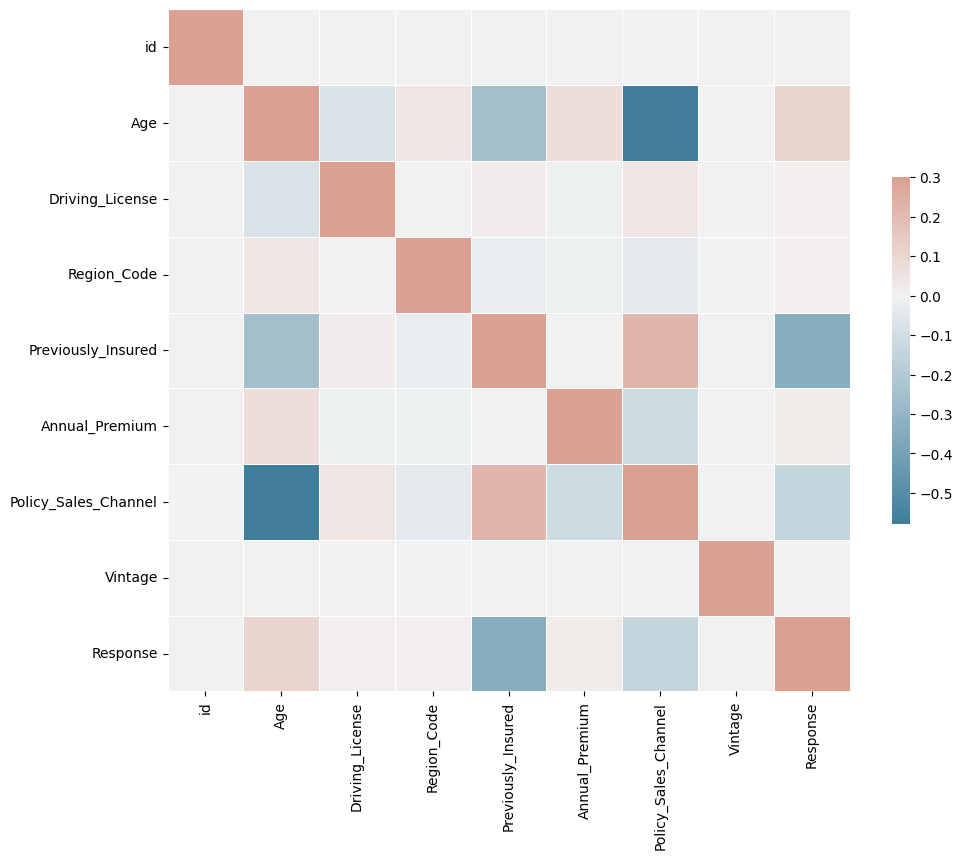

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Вычисление корреляции
num_cols = data.select_dtypes(exclude='object').columns
corr = data[num_cols].corr()

# Создание фигуры и осей с корректным параметром figsize
f, ax = plt.subplots(figsize=(11, 9))

# Построение тепловой карты
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(
    corr, 
    cmap=cmap, 
    vmax=0.3, 
    center=0,
    square=True, 
    linewidths=0.5, 
    cbar_kws={"shrink": 0.5}
)

plt.show()


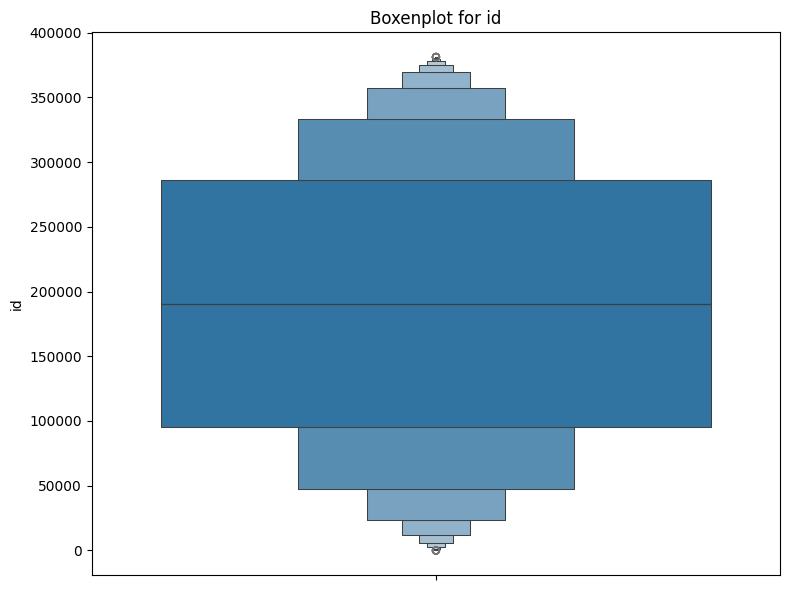

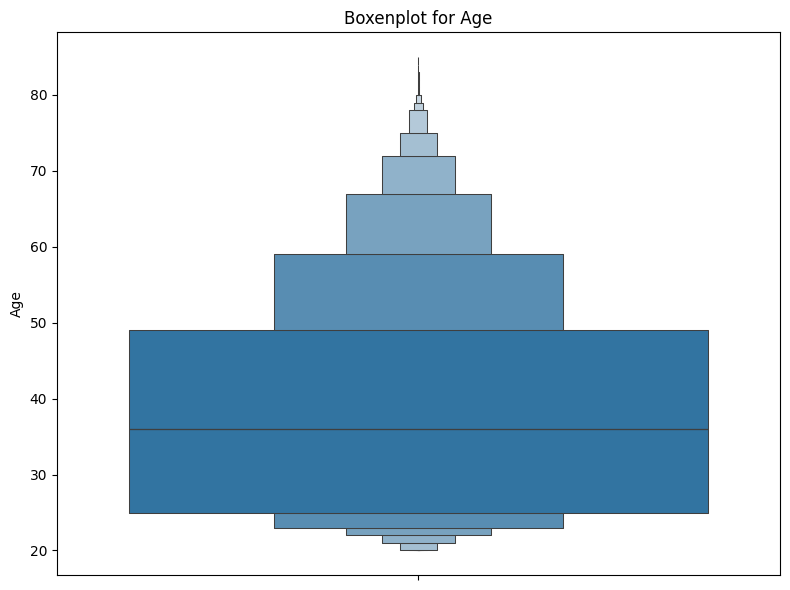

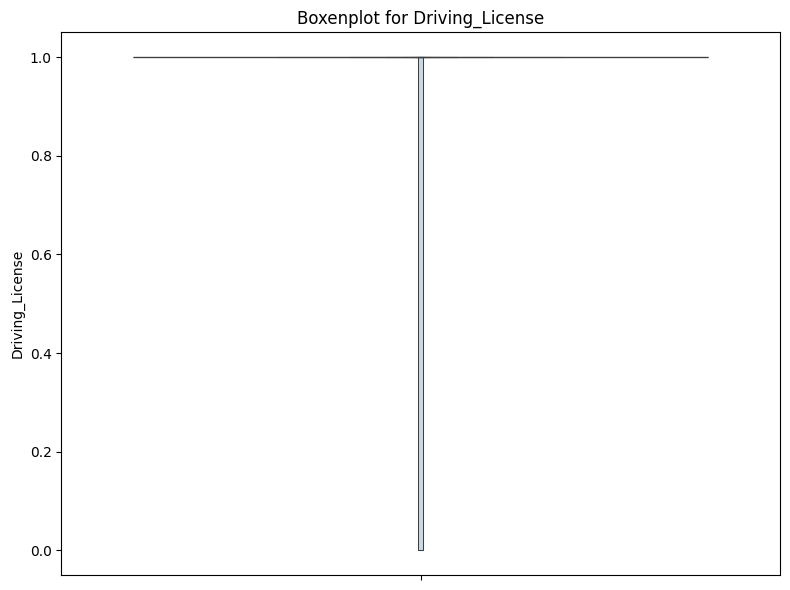

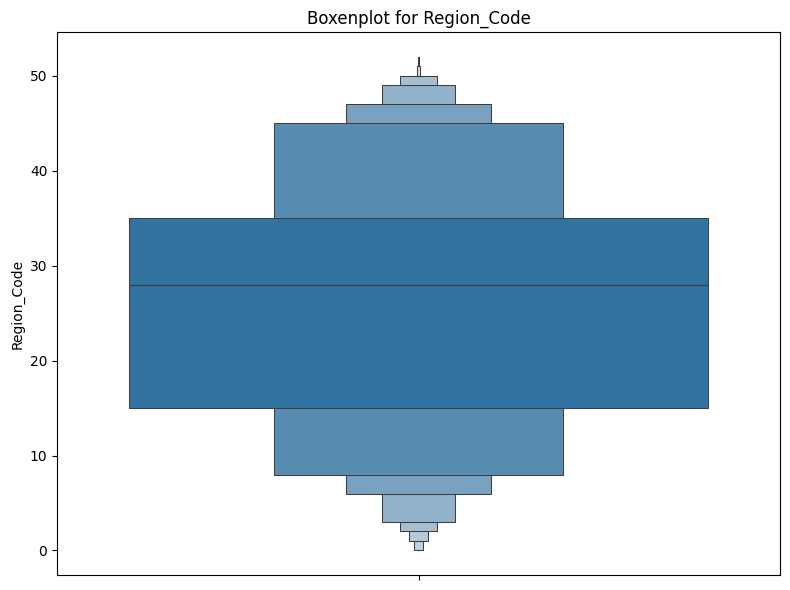

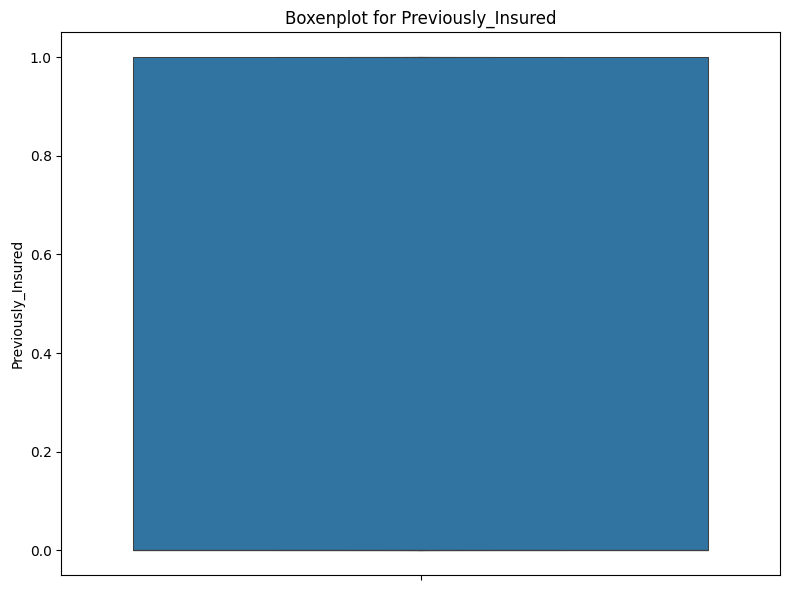

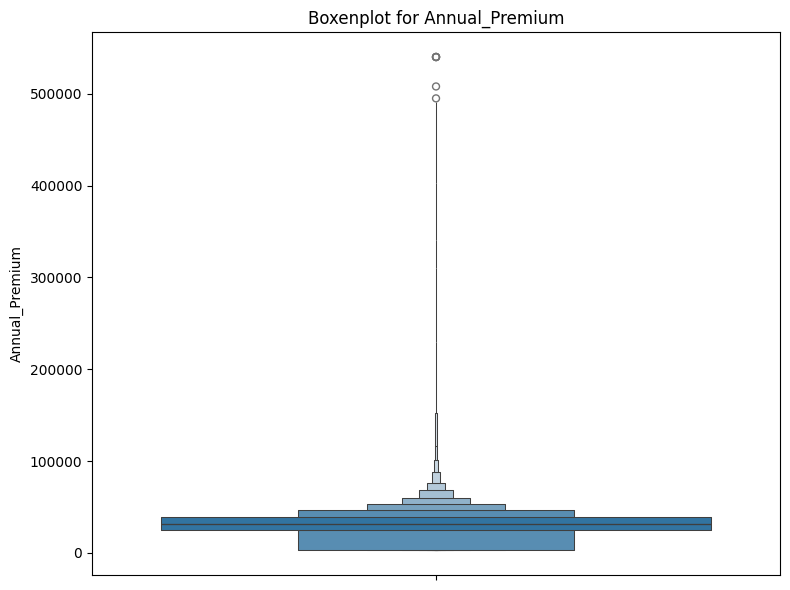

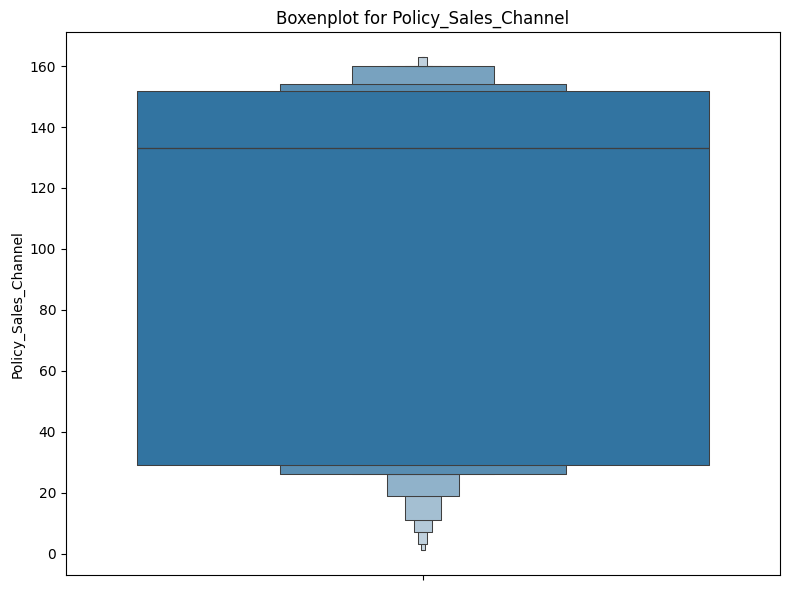

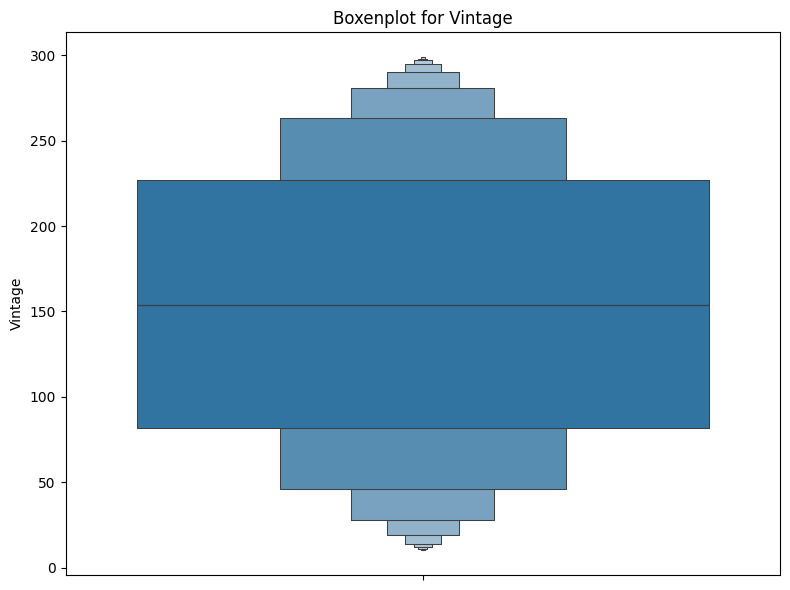

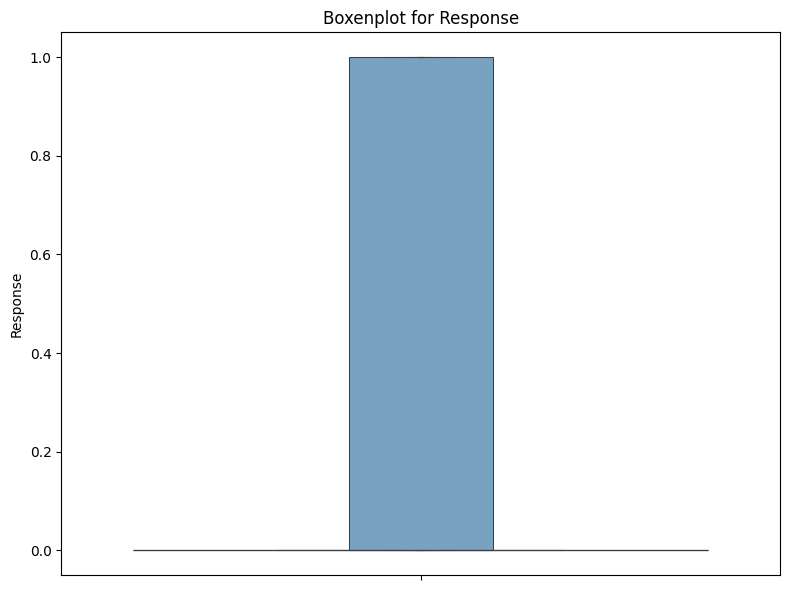

In [61]:

# Создание графиков в отдельных окнах
for col in num_cols:
    plt.figure(figsize=(8, 6))  # Размер каждого графика
    sns.boxenplot(data[col])
    plt.title(f"Boxenplot for {col}")
    plt.tight_layout()
    plt.show()

In [39]:
data.groupby('Response').count()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage
Response,,,,,,,,,,,
0,334399,334399,334399,334399,334399,334399,334399,334399,334399,334399,334399
1,46710,46710,46710,46710,46710,46710,46710,46710,46710,46710,46710


In [38]:
data['Response'].value_counts(True)

Response
0    0.877437
1    0.122563
Name: proportion, dtype: float64

<Axes: xlabel='count', ylabel='Vehicle_Age'>

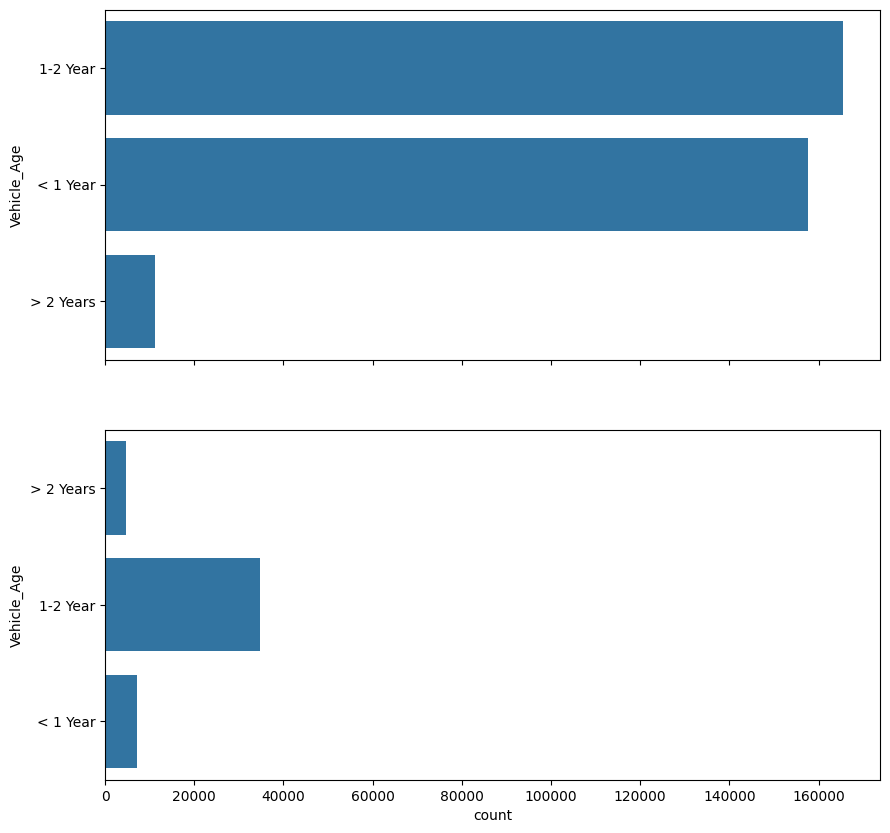

In [31]:
fig, ax = plt.subplots(2, 1, sharex=True, figsize=(10, 10))
sns.countplot(data[data['Response'] == 0]['Vehicle_Age'],ax=ax[0])
sns.countplot(data[data['Response'] == 1]['Vehicle_Age'],ax=ax[1])


In [40]:
# Your code here (Hint: используйте метод value_counts для проверки баланса классов)
data['Response'].value_counts(True)

Response
0    0.877437
1    0.122563
Name: proportion, dtype: float64

In [42]:
# Your code here (Hint: попробуйте pd.get_dummies для one-hot кодирования)
cat_cols = data.select_dtypes(include='object').columns
df = pd.get_dummies(data,prefix=cat_cols)
df

,id,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Gender_Female,Gender_Male,Vehicle_Age_1-2 Year,Vehicle_Age_< 1 Year,Vehicle_Age_> 2 Years,Vehicle_Damage_No,Vehicle_Damage_Yes
0,1,44,1,28.0,0,40454.0,26.0,217,1,False,True,False,False,True,False,True
1,2,76,1,3.0,0,33536.0,26.0,183,0,False,True,True,False,False,True,False
2,3,47,1,28.0,0,38294.0,26.0,27,1,False,True,False,False,True,False,True
3,4,21,1,11.0,1,28619.0,152.0,203,0,False,True,False,True,False,True,False
4,5,29,1,41.0,1,27496.0,152.0,39,0,True,False,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
381104,381105,74,1,26.0,1,30170.0,26.0,88,0,False,True,True,False,False,True,False
381105,381106,30,1,37.0,1,40016.0,152.0,131,0,False,True,False,True,False,True,False
381106,381107,21,1,30.0,1,35118.0,160.0,161,0,False,True,False,True,False,True,False
381107,381108,68,1,14.0,0,44617.0,124.0,74,0,True,False,False,False,True,False,True


In [44]:
df.drop(columns='id')

,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Gender_Female,Gender_Male,Vehicle_Age_1-2 Year,Vehicle_Age_< 1 Year,Vehicle_Age_> 2 Years,Vehicle_Damage_No,Vehicle_Damage_Yes
0,44,1,28.0,0,40454.0,26.0,217,1,False,True,False,False,True,False,True
1,76,1,3.0,0,33536.0,26.0,183,0,False,True,True,False,False,True,False
2,47,1,28.0,0,38294.0,26.0,27,1,False,True,False,False,True,False,True
3,21,1,11.0,1,28619.0,152.0,203,0,False,True,False,True,False,True,False
4,29,1,41.0,1,27496.0,152.0,39,0,True,False,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
381104,74,1,26.0,1,30170.0,26.0,88,0,False,True,True,False,False,True,False
381105,30,1,37.0,1,40016.0,152.0,131,0,False,True,False,True,False,True,False
381106,21,1,30.0,1,35118.0,160.0,161,0,False,True,False,True,False,True,False
381107,68,1,14.0,0,44617.0,124.0,74,0,True,False,False,False,True,False,True


**Задание 1.** Обучите градиентный бустинг из sklearn на данных и замерьте accuracy и f1-score на тестовой выборке. В качестве параметров ансамбля установите `learning_rate = 1`, `random_state = 1`, `n_estimators = 100`. Изобразите ROC-кривую и посчитайте AUC, оцените качество классификации. (2б)

P.S. для всех прочих моделей в этом домашнем задании тоже фиксируйте `random_state = 1`. Как думаете, что может быть случайного в процедуре обучения градиентного бустинга?

In [63]:
# Your code here (Hint: используйте train_test_split для разделения данных и sklearn.ensemble.GradientBoostingClassifier для обучения модели)
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import RocCurveDisplay,roc_curve,auc
X = df.drop(columns='Response')
y = df['Response']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=1)
boosting = GradientBoostingClassifier(learning_rate=1,random_state=1,n_estimators=100)

boosting.fit(X_train,y_train)


TypeError: RocCurveDisplay.__init__() missing 2 required keyword-only arguments: 'fpr' and 'tpr'

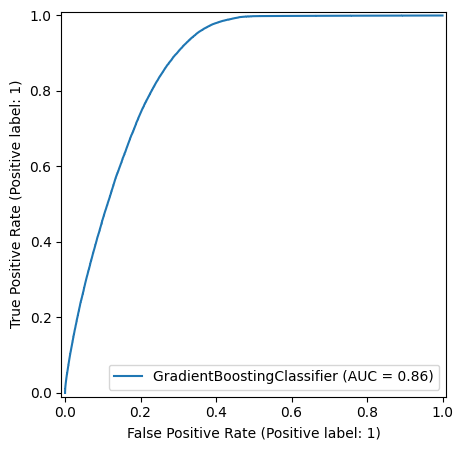

In [65]:
RocCurveDisplay.from_estimator(boosting,X_train,y_train)

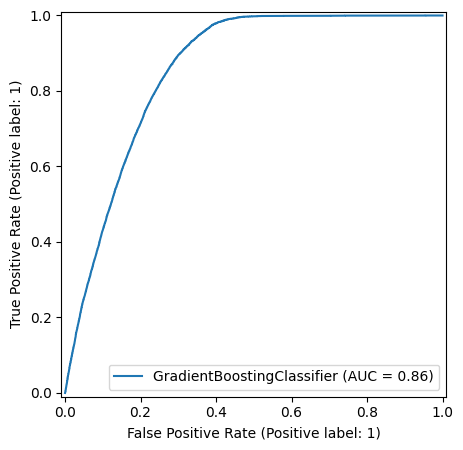

In [72]:
# Your code here (Hint: roc_curve и auc помогут с построением ROC-кривой и подсчетом AUC)
RocCurveDisplay.from_estimator(boosting,X_test,y_test)

In [76]:
from sklearn.metrics import classification_report, f1_score

y_pred_test = boosting.predict(X_test)

clr = classification_report(y_test,y_pred_test)
print(clr)

              precision    recall  f1-score   support

           0       0.88      0.99      0.93     67052
           1       0.44      0.04      0.07      9170

    accuracy                           0.88     76222
   macro avg       0.66      0.52      0.50     76222
weighted avg       0.83      0.88      0.83     76222



**Задание 2.** Переберите параметры `n_estimators` и `learning_rate` по двумерной сетке. При обучении в цикле сразу считайте f1-score на тестовой выборке и сохраняйте результат в матрицу. Для какого алгоритма качество окажется максимальным? 

Постройте кривые для метрики f1-score в зависимости от числа шагов для нескольких learning_rate. Изобразите heatmap полученной матрицы. Сделайте вывод, как количество шагов влияет на качество совместно с различной скоростью обучения? (2б)

P.S. для подсчета f1-score передайте в функцию параметр `average='weighted'`, чтобы учитывался еще и баланс классов (вспомните микро/макро-усреднения).

In [77]:
# Your code here (Hint: создайте циклы по сетке параметров n_estimators и learning_rate, используйте f1_score для вычисления метрики)
n_estimators_list = [5, 10, 20, 50, 100, 200, 700]
learning_rate_list = [1, 0.1,0.05, 0.01]

f1_matrix = np.zeros((len(n_estimators_list),len(learning_rate_list)))
for i, n in enumerate(n_estimators_list):
    for j, lr in enumerate(learning_rate_list):
        model = GradientBoostingClassifier(n_estimators=n,learning_rate=lr,max_depth=5,random_state=1)
        model.fit(X_train,y_train)
        y_pred_test = model.predict(X_test)
        f1_matrix[i,j] = f1_score(y_test,y_pred_test,average='weighted')

f1_df = pd.DataFrame(f1_matrix,index=map(str, n_estimators_list), 
                            columns=map(str, learning_rate_list))
f1_df

,1,0.1,0.05,0.01
5,0.825764,0.823390,0.823390,0.823390
10,0.828598,0.823390,0.823390,0.823390
20,0.830813,0.823390,0.823390,0.823390
50,0.833014,0.823409,0.823390,0.823390
100,0.835279,0.823903,0.823454,0.823390
200,0.837081,0.825464,0.823836,0.823390
700,0.839142,0.830222,0.826626,0.823594


<Axes: >

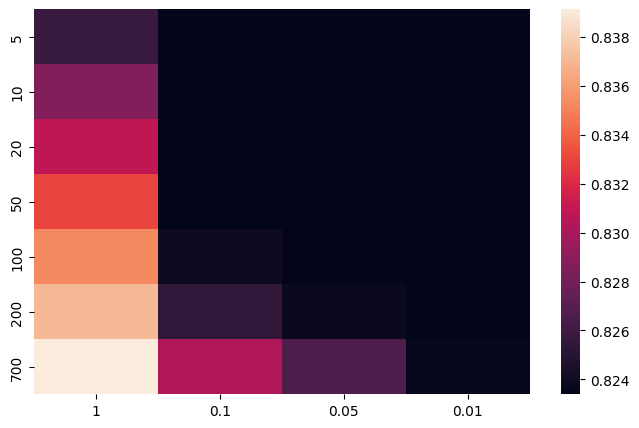

In [78]:
# Your code here (Hint: визуализируйте результаты с помощью plt.plot и sns.heatmap)
sns.heatmap(f1_df)

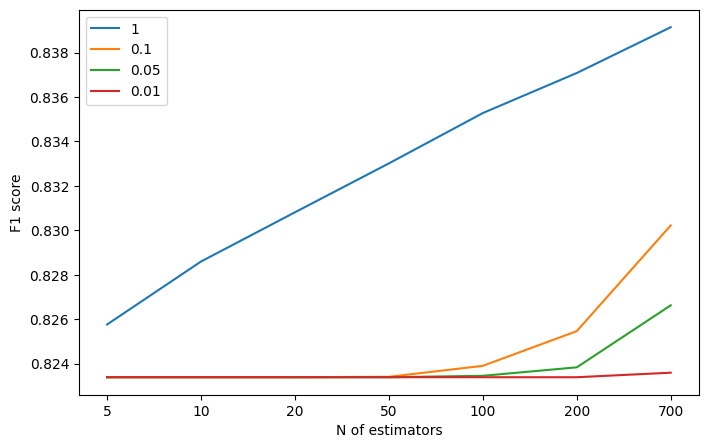

In [82]:
plt.plot(f1_df)
plt.xlabel("N of estimators")
plt.ylabel("F1 score")
plt.legend(learning_rate_list)

**Задание 3.** Вам потребуется обучить 4 модели и посчитать метрику f1-score на тестовой и обучающей выборках для каждой модели. 
1. Случайный лес с максимальной глубиной деревьев 5,
2. Случайный лес с максимальной глубиной деревьев 5000,
3. Градиентный бустинг с максимальной глубиной деревьев 5,
4. Градиентный бустинг с максимальной глубиной деревьев 5000.

Для каждой модели перебирайте значения `n_estimators`, как в предыдущем задании. Отрисуйте графики зависимости f1-score от количества шагов. 

Если в качестве базовой модели брать неглубокие деревья, то какая модель лучше запоминает обучающую выборку: случайный лес или градиентный бустинг? Какая из них лучше предсказывает на тестовой выборке? Как изменятся ответы, если базовая модель - это глубокое решающее дерево?

Подвержен ли переобучению случайный лес и градиентный бустинг? Как это отражается на графиках? (4б)

In [83]:
# Your code here (Hint: используйте RandomForestClassifier и GradientBoostingClassifier с различными max_depth и n_estimators)
from sklearn.ensemble import RandomForestClassifier
n_estimators_list = [5, 10, 20, 50, 100, 200, 700,1000]
max_depth_list = [5,5000]
f1_matrix_train = np.zeros((len(n_estimators_list),4))
f1_matrix_test = np.zeros((len(n_estimators_list),4))
for i, n in enumerate(n_estimators_list):
    for j, d in enumerate(max_depth_list):
        rf = RandomForestClassifier(n_estimators=n,max_depth=d,random_state=1)
        rf.fit(X_train,y_train)
        rf_pred_train,rf_pred_test = rf.predict(X_train),rf.predict(X_test)
        gb = GradientBoostingClassifier(n_estimators=n,max_depth=d,random_state=1)
        gb.fit(X_train,y_train)
        gb_pred_train,gb_pred_test = gb.predict(X_train),gb.predict(X_test)
        f1_matrix_train[i][j*2:j*2+2] = (f1_score(y_train,rf_pred_train),f1_score(y_train,gb_pred_train))
        f1_matrix_test[i][j*2:j*2+2] = (f1_score(y_test,rf_pred_test),f1_score(y_test,gb_pred_test)) 
        



In [88]:
f1df_train = pd.DataFrame(f1_matrix_train,columns=map(str,[5,5,5000,5000]),index=map(str,n_estimators_list))
f1df_train

,5,5,5000,5000
5,0.0,0.000053,0.921024,1.0
10,0.0,0.000053,0.944391,1.0
20,0.0,0.000160,0.984435,1.0
50,0.0,0.001065,0.998706,1.0
100,0.0,0.008429,0.999960,1.0
200,0.0,0.032600,1.000000,1.0
700,0.0,0.120531,1.000000,1.0
1000,0.0,0.169623,1.000000,1.0


In [89]:
f1df_test = pd.DataFrame(f1_matrix_test,columns=map(str,[5,5,5000,5000]),index=map(str,n_estimators_list))
f1df_test

,5,5,5000,5000
5,0.0,0.000000,0.254738,0.262502
10,0.0,0.000000,0.168529,0.268307
20,0.0,0.000000,0.152473,0.279191
50,0.0,0.000218,0.139456,0.284693
100,0.0,0.004558,0.129608,0.288893
200,0.0,0.017781,0.122684,0.289922
700,0.0,0.059059,0.120305,0.289922
1000,0.0,0.074208,0.120744,0.289922


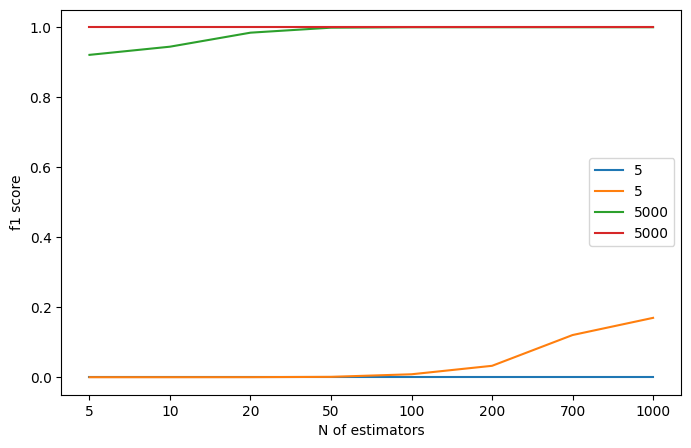

In [92]:
# Your code here (Hint: отобразите кривые зависимости f1-score для обучающей и тестовой выборок)
plt.plot(f1df_train)
plt.ylabel("f1 score")
plt.xlabel("N of estimators")
plt.legend(sorted(max_depth_list * 2)) #Так потому что я таким образом заносил в матрицу значения


**Задание 4.** Установите библиотеку `catboost`. Главной особенностью catboost является наличие встроенной обработки категориальных признаков. 

Обучите CatBoostClassifier с дефолтными параметрами. Используйте датасет до (разбейте на train/test по старой логике с тем же random state'ом). Категориальные колонки передайте в параметр `cat_features` метода `fit`. Catboost сам с ними разберется.

Сравните качество с моделью из предыдущего задания. Стало ли лучше?

Сравните feature importances в модели из задания 2 и в catboost с помощью соответствующих методов, изобразите их, используя `barplot`. \
Какие признаки стали более важными с новым методом кодирования? (4б)

In [1]:
from catboost import CatBoostClassifier

In [7]:
data.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response'],
      dtype='object')

In [8]:
# Your code here (Hint: используйте CatBoostClassifier, передав cat_features в метод fit)
from sklearn.model_selection import train_test_split
cat_features = data.select_dtypes('object').columns.to_list()
X = data.drop(columns=['Response'])
y = data['Response']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=1)
catboost = CatBoostClassifier()
catboost.fit(X_train,y_train,cat_features)

Learning rate set to 0.118484
0:	learn: 0.5032252	total: 146ms	remaining: 2m 26s
1:	learn: 0.4047653	total: 222ms	remaining: 1m 50s
2:	learn: 0.3536241	total: 311ms	remaining: 1m 43s
3:	learn: 0.3254332	total: 398ms	remaining: 1m 39s
4:	learn: 0.3085755	total: 488ms	remaining: 1m 37s
5:	learn: 0.2976997	total: 590ms	remaining: 1m 37s
6:	learn: 0.2901481	total: 665ms	remaining: 1m 34s
7:	learn: 0.2855379	total: 748ms	remaining: 1m 32s
8:	learn: 0.2818185	total: 823ms	remaining: 1m 30s
9:	learn: 0.2794379	total: 891ms	remaining: 1m 28s
10:	learn: 0.2773177	total: 964ms	remaining: 1m 26s
11:	learn: 0.2760433	total: 1.03s	remaining: 1m 25s
12:	learn: 0.2743752	total: 1.09s	remaining: 1m 23s
13:	learn: 0.2733590	total: 1.16s	remaining: 1m 21s
14:	learn: 0.2723554	total: 1.23s	remaining: 1m 20s
15:	learn: 0.2717644	total: 1.3s	remaining: 1m 20s
16:	learn: 0.2711743	total: 1.37s	remaining: 1m 19s
17:	learn: 0.2708113	total: 1.45s	remaining: 1m 19s
18:	learn: 0.2703748	total: 1.53s	remaining: 

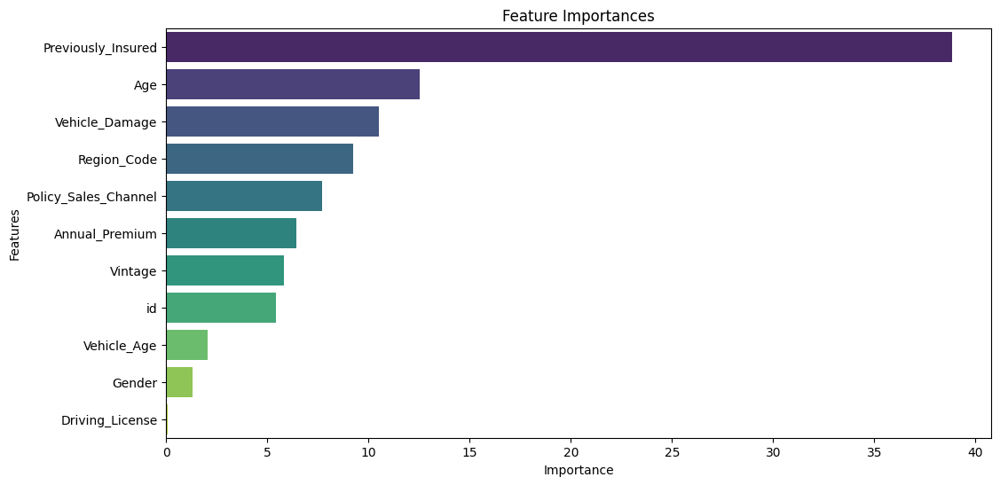

In [15]:
# Your code here (Hint: сравните feature_importances_ с помощью sns.barplot)
fi = catboost.feature_importances_
fi_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': fi})

# Сортируем по важности
fi_df = fi_df.sort_values(by='Importance', ascending=False)

# Строим график
plt.figure(figsize=(12, 6))
sns.barplot(data=fi_df, x='Importance', y='Feature', palette='viridis')
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()


In [18]:
from sklearn.metrics import classification_report
y_pred_test = catboost.predict(X_test)
print(classification_report(y_test,y_pred_test))
y_pred = catboost.predict(data.drop(columns='Response').head())
data.head()

              precision    recall  f1-score   support

           0       0.88      0.99      0.94     67052
           1       0.46      0.03      0.06      9170

    accuracy                           0.88     76222
   macro avg       0.67      0.51      0.50     76222
weighted avg       0.83      0.88      0.83     76222



,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


**Задание 5.** Установите библиотеку `lightgbm`. На сегодняшний день это наиболее быстрый метод градиентного бустинга, при этом расходующий небольшое количество оперативной памяти.

Обучите `LGBMClassifier` на изначальных данных и добейтесь максимального качества на тестовой выборке, перебрав параметры глубины деревьев, количества шагов, скорости обучения и т.д. по заданной сетке.

In [22]:
# Your code here (Hint: используйте GridSearchCV для перебора параметров и LGBMClassifier для обучения модели)
from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV
cat_cols = data.select_dtypes(include='object').columns
df = pd.get_dummies(data,prefix=cat_cols)
X = df.drop('Response',axis=1)
y = df['Response']
params = {'n_estimators': [100, 500, 1000, 2000],
          'max_depth': [2, 3, 5, 100],
          'learning_rate': [0.1, 0.01,0.05, 0.001]}
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=1)
grid = GridSearchCV(LGBMClassifier(random_state=1,n_jobs=-1),params)
grid.fit(X_train,y_train)
y_pred = grid.predict(X_test)
print(classification_report(y_test, y_pred, digits=4))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 30032, number of negative: 213877
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001796 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1024
[LightGBM] [Info] Number of data points in the train set: 243909, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.123128 -> initscore=-1.963138
[LightGBM] [Info] Start training from score -1.963138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

In [23]:
# Your code here (Hint: после подбора параметров выведите лучшие параметры и метрики)
grid.best_estimator_

LGBMClassifier(max_depth=3, n_estimators=500, n_jobs=-1, random_state=1)